In [12]:
%matplotlib inline
%load_ext autoreload
%autoreload 2
import numpy as np
import matplotlib.pyplot as plt
import rcca_modified as rcca
#reload(rcca)
from unils_cca import set_diag_to_zero
from metrics import ClassificationResult
from unils_cca import binarize, set_diag_to_zero, BuildMatrixA, printMatrix, print_q_val_hist, zscore, plot_zscore, BuildFeatureVector,\
train_test_2D, build_distance_for_node,  get_features, build_distance_matrix, remove_ambiguous, \
get_pairs_distance_matched,  reshape_2d_to_1d, demean, get_pos_neg_y_and_ypred_at_thres, binarize_wAmbig, subsample_neg
import copy
from sklearn.metrics import auc, precision_recall_curve, roc_auc_score

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [25]:
InteractionsFileCaptureC='/srv/scratch/mtaranov/CaptureC_ChicagoCalls/CaptureC_SC_bait-bait.bed.gz'
#InteractionsFileCaptureC='/mnt/lab_data/kundaje/mtaranov/ChicagoCalls/D0_D2D8_merge_BaitToBait_intra.bed.gz'
PromoterFile='/srv/scratch/mtaranov/HindIII/PromoterCapture_Digest_Human_HindIII_baits_ID.bed'
DATADIR='/users/mtaranov/CCA_model/data/'
DATADIR_CaptureC = DATADIR+'CaptureC/'
DATADIR_kernels = DATADIR+'CaptureC_kernels/'
DATADIR_nodes = DATADIR+'nodes/'
DATADIR_features = DATADIR+'features/'
DATADIR_preds = DATADIR+'preds_2d/'
DATADIR_weights = DATADIR+'weights/'
DATADIR_dist_matched_labels_CaptureC = DATADIR+'labels/labels_CaptureC_dist_matched/'
DATADIR_dist_matched_preds_CaptureC = DATADIR+'labels/preds_CaptureC_dist_matched/'

In [19]:
def performance_on_pos_and_neg_subsmpl(thres):
    all_chrs = ['chr'+str(i+1) for i in range(22)]+['chrX']
    ROC=[]
    PRC=[]
    for chr in all_chrs:
        print chr
        preds = np.load(DATADIR_preds+'pred_2d_NoKernel_'+chr+'.npy')
        labels = np.load(DATADIR_CaptureC+'CaptureC_'+chr+'.npy')
        y = set_diag_to_zero(labels).reshape((labels.shape[0]*labels.shape[0],1)).astype(int)
        y_pred = preds.reshape((preds.shape[0]*preds.shape[0],1))
        y_neg_sub,y_pred_neg_sub = subsample_neg(y, y_pred, 1, thres=thres)
        print(ClassificationResult(binarize(y_neg_sub),y_pred_neg_sub))
        print chr
        printMatrix(preds, 'score', 1, 1, str(chr)+' - Prediction')
        printMatrix(binarize(labels, thres=thres), 'score', 1, 1, str(chr)+' LABELS')
        ROC.append(roc_auc_score(binarize(y_neg_sub),y_pred_neg_sub))
        precision, recall = precision_recall_curve(binarize(y_neg_sub),y_pred_neg_sub)[:2]
        PRC.append(auc(recall, precision))

    for i in enumerate(all_chrs):
        print i[1], "ROC=", ROC[i[0]], "PRC=", PRC[i[0]]
    print "Average across all chrs: ROC=", sum(ROC)/len(ROC), " PRC=", sum(PRC)/len(PRC)

## Performance for all nodes in held out chr 
weights are averagded across all chrs except the held out one

### Evaluation on positives+subsapmled negatives

chr1
Balanced Accuracy: 67.62%	auROC: 0.763	 auPRC: 0.720
Recall at 5% | 10% | 25% FDR: 4.3% | 5.2% | 18.8%	Num Positives: 44402	 Num Negatives: 44402

chr1
0.99999999989
(2272, 2272)
Limit: 0.99999999989


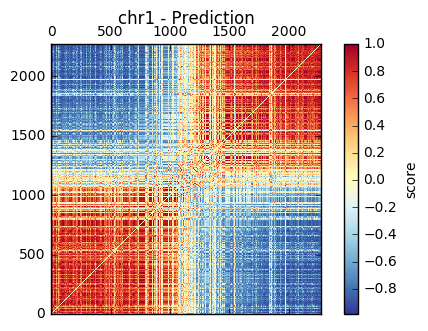

1.0
(2272, 2272)
Limit: 1.0


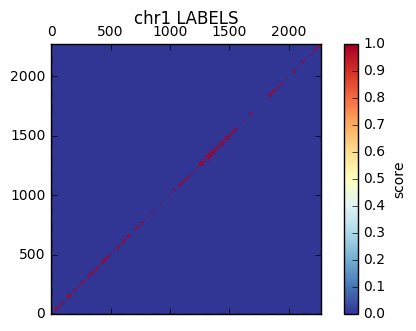

chr2
Balanced Accuracy: 69.85%	auROC: 0.776	 auPRC: 0.729
Recall at 5% | 10% | 25% FDR: 4.2% | 5.0% | 24.6%	Num Positives: 22020	 Num Negatives: 22020

chr2
0.999999999894
(1604, 1604)
Limit: 0.999999999894


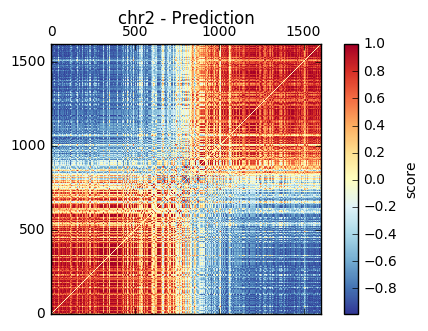

1.0
(1604, 1604)
Limit: 1.0


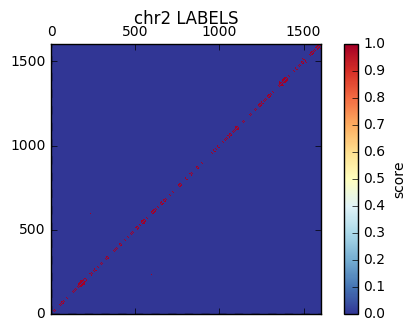

chr3
Balanced Accuracy: 65.83%	auROC: 0.758	 auPRC: 0.713
Recall at 5% | 10% | 25% FDR: 3.7% | 4.1% | 15.0%	Num Positives: 18412	 Num Negatives: 18412

chr3
0.999999999598
(1331, 1331)
Limit: 0.999999999598


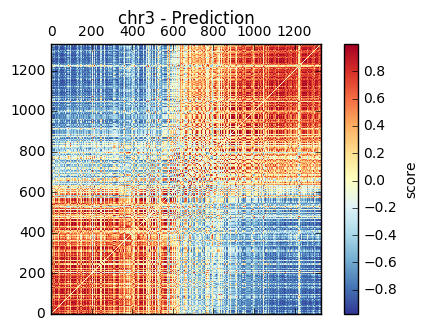

1.0
(1331, 1331)
Limit: 1.0


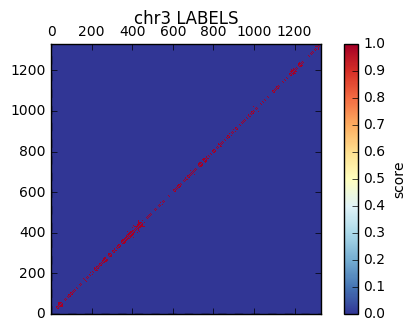

chr4
Balanced Accuracy: 65.51%	auROC: 0.730	 auPRC: 0.714
Recall at 5% | 10% | 25% FDR: 5.7% | 6.9% | 28.1%	Num Positives: 9972	 Num Negatives: 9972

chr4
0.999999999957
(947, 947)
Limit: 0.999999999957


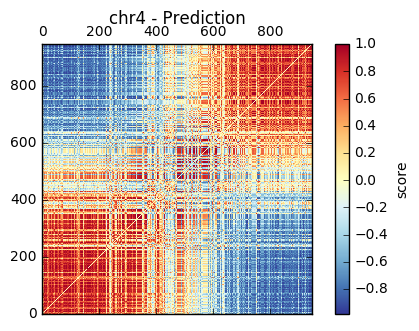

1.0
(947, 947)
Limit: 1.0


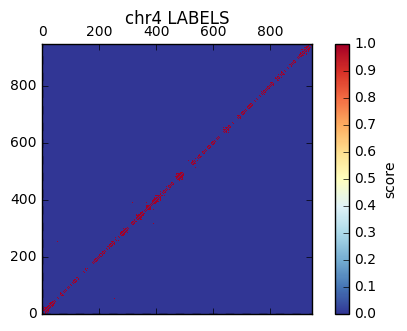

chr5
Balanced Accuracy: 63.17%	auROC: 0.733	 auPRC: 0.698
Recall at 5% | 10% | 25% FDR: 3.2% | 3.5% | 21.8%	Num Positives: 15484	 Num Negatives: 15484

chr5
0.999999999031
(1117, 1117)
Limit: 0.999999999031


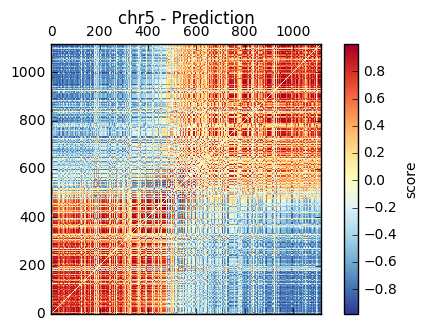

1.0
(1117, 1117)
Limit: 1.0


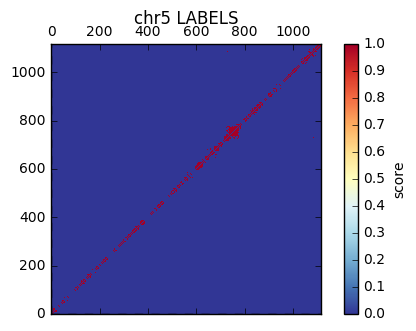

chr6
Balanced Accuracy: 64.01%	auROC: 0.754	 auPRC: 0.712
Recall at 5% | 10% | 25% FDR: 3.5% | 4.1% | 21.8%	Num Positives: 20022	 Num Negatives: 20022

chr6
0.999999999968
(1224, 1224)
Limit: 0.999999999968


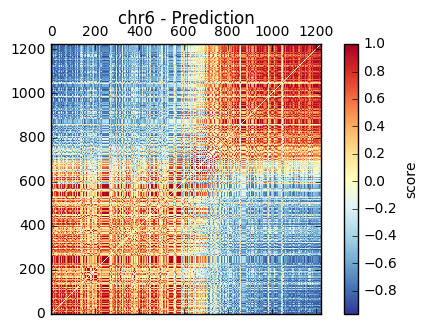

1.0
(1224, 1224)
Limit: 1.0


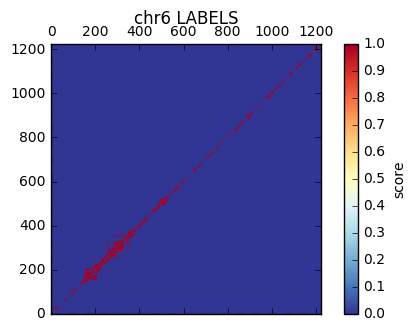

chr7
Balanced Accuracy: 64.24%	auROC: 0.734	 auPRC: 0.703
Recall at 5% | 10% | 25% FDR: 5.5% | 5.8% | 14.8%	Num Positives: 12506	 Num Negatives: 12506

chr7
0.99999999957
(1020, 1020)
Limit: 0.99999999957


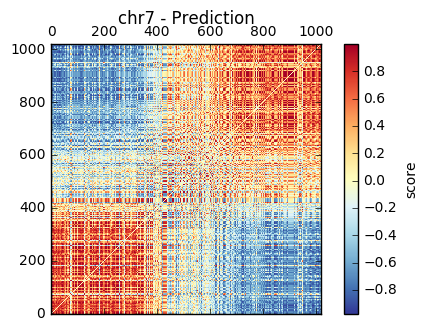

1.0
(1020, 1020)
Limit: 1.0


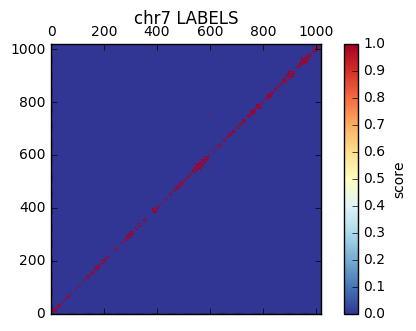

chr8
Balanced Accuracy: 63.87%	auROC: 0.732	 auPRC: 0.698
Recall at 5% | 10% | 25% FDR: 5.0% | 5.5% | 8.9%	Num Positives: 10742	 Num Negatives: 10742

chr8
0.999999999812
(897, 897)
Limit: 0.999999999812


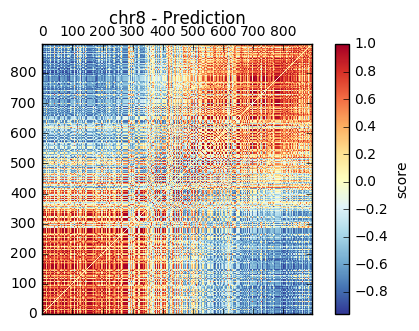

1.0
(897, 897)
Limit: 1.0


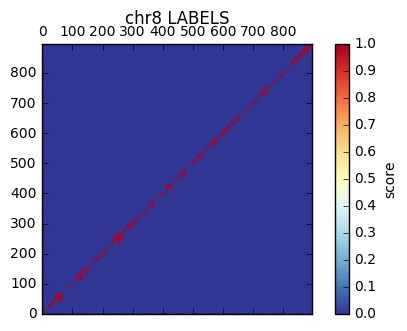

chr9
Balanced Accuracy: 63.59%	auROC: 0.744	 auPRC: 0.703
Recall at 5% | 10% | 25% FDR: 2.8% | 2.9% | 14.7%	Num Positives: 13246	 Num Negatives: 13246

chr9
0.999999997023
(859, 859)
Limit: 0.999999997023


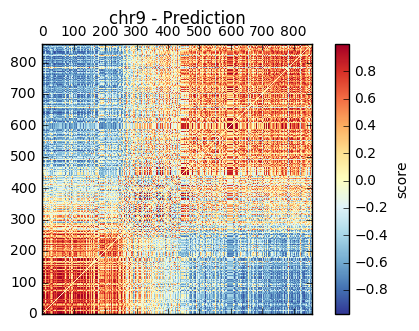

1.0
(859, 859)
Limit: 1.0


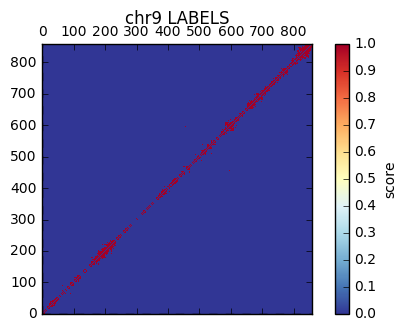

chr10
Balanced Accuracy: 60.48%	auROC: 0.692	 auPRC: 0.676
Recall at 5% | 10% | 25% FDR: 4.1% | 4.5% | 15.4%	Num Positives: 12432	 Num Negatives: 12432

chr10
0.999999999909
(943, 943)
Limit: 0.999999999909


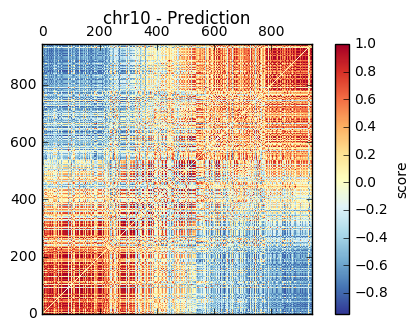

1.0
(943, 943)
Limit: 1.0


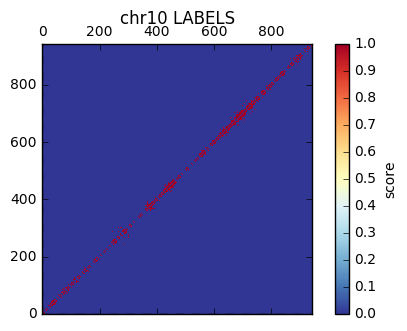

chr11
Balanced Accuracy: 64.64%	auROC: 0.714	 auPRC: 0.734
Recall at 5% | 10% | 25% FDR: 13.8% | 18.4% | 38.8%	Num Positives: 31474	 Num Negatives: 31474

chr11
0.999999999733
(1401, 1401)
Limit: 0.999999999733


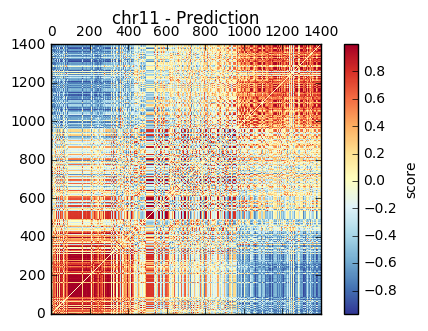

1.0
(1401, 1401)
Limit: 1.0


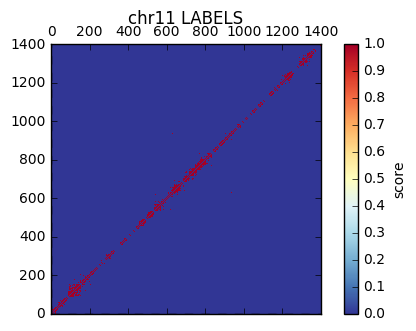

chr12
Balanced Accuracy: 60.59%	auROC: 0.688	 auPRC: 0.677
Recall at 5% | 10% | 25% FDR: 4.9% | 5.2% | 16.5%	Num Positives: 22228	 Num Negatives: 22228

chr12
0.999999999988
(1200, 1200)
Limit: 0.999999999988


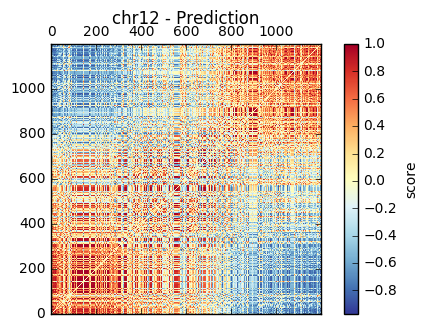

1.0
(1200, 1200)
Limit: 1.0


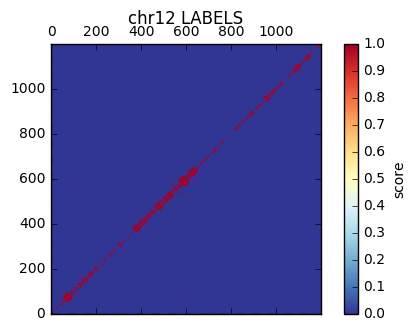

chr13
Balanced Accuracy: 59.68%	auROC: 0.690	 auPRC: 0.663
Recall at 5% | 10% | 25% FDR: 4.1% | 4.9% | 6.8%	Num Positives: 4116	 Num Negatives: 4116

chr13
0.999999975916
(452, 452)
Limit: 0.999999975916


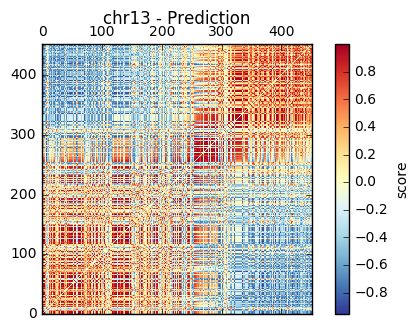

1.0
(452, 452)
Limit: 1.0


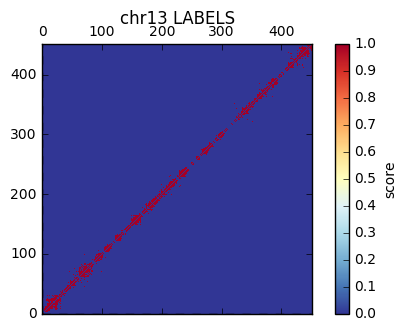

chr14
Balanced Accuracy: 59.68%	auROC: 0.673	 auPRC: 0.674
Recall at 5% | 10% | 25% FDR: 4.8% | 5.6% | 20.6%	Num Positives: 13900	 Num Negatives: 13900

chr14
0.999999999847
(779, 779)
Limit: 0.999999999847


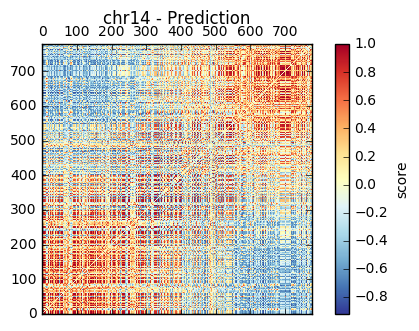

1.0
(779, 779)
Limit: 1.0


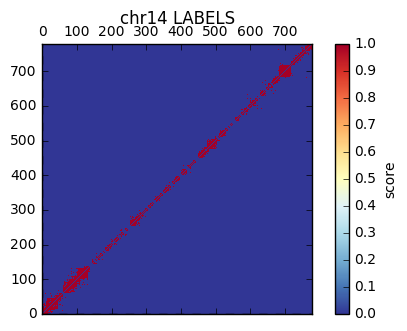

chr15
Balanced Accuracy: 57.67%	auROC: 0.635	 auPRC: 0.655
Recall at 5% | 10% | 25% FDR: 8.5% | 9.7% | 17.7%	Num Positives: 8622	 Num Negatives: 8622

chr15
0.999999998981
(629, 629)
Limit: 0.999999998981


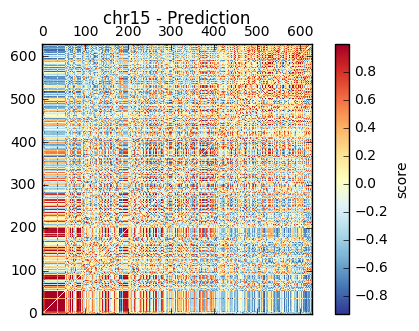

1.0
(629, 629)
Limit: 1.0


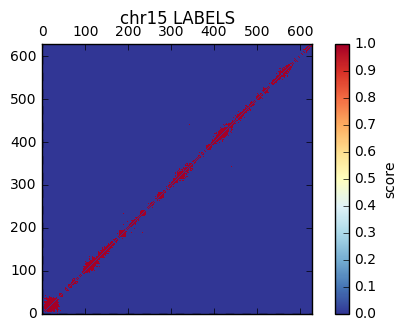

chr16
Balanced Accuracy: 56.88%	auROC: 0.657	 auPRC: 0.630
Recall at 5% | 10% | 25% FDR: 1.1% | 1.2% | 2.8%	Num Positives: 13528	 Num Negatives: 13528

chr16
0.999999996278
(726, 726)
Limit: 0.999999996278


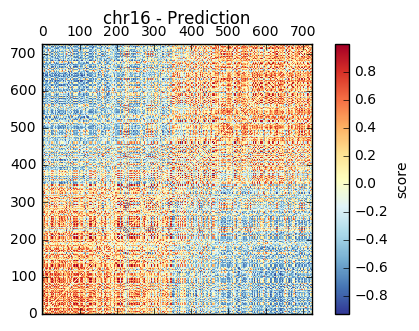

1.0
(726, 726)
Limit: 1.0


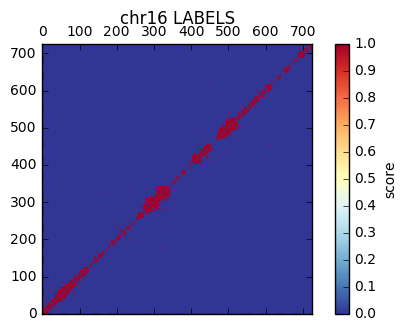

chr17
Balanced Accuracy: 56.61%	auROC: 0.623	 auPRC: 0.626
Recall at 5% | 10% | 25% FDR: 1.7% | 2.3% | 9.5%	Num Positives: 23082	 Num Negatives: 23082

chr17
0.999999991537
(1057, 1057)
Limit: 0.999999991537


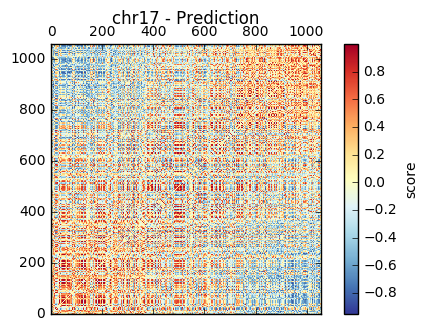

1.0
(1057, 1057)
Limit: 1.0


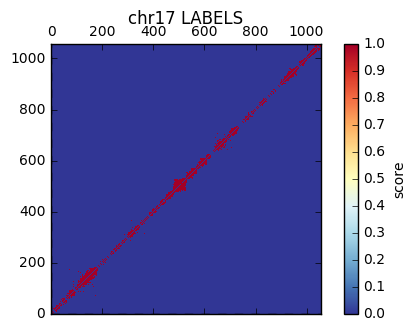

chr18
Balanced Accuracy: 55.89%	auROC: 0.623	 auPRC: 0.619
Recall at 5% | 10% | 25% FDR: 4.5% | 4.9% | 7.1%	Num Positives: 2948	 Num Negatives: 2948

chr18
0.999999979513
(352, 352)
Limit: 0.999999979513


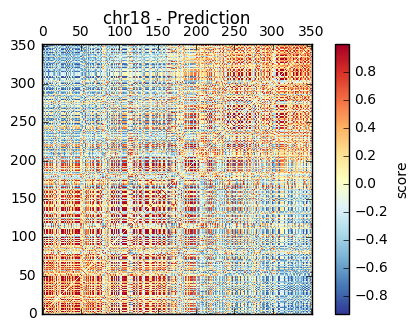

1.0
(352, 352)
Limit: 1.0


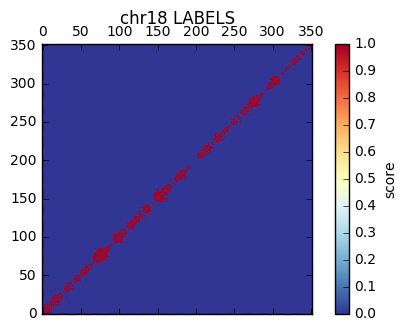

chr19
Balanced Accuracy: 55.30%	auROC: 0.602	 auPRC: 0.606
Recall at 5% | 10% | 25% FDR: 1.2% | 1.5% | 8.0%	Num Positives: 27010	 Num Negatives: 27010

chr19
0.999999981962
(1052, 1052)
Limit: 0.999999981962


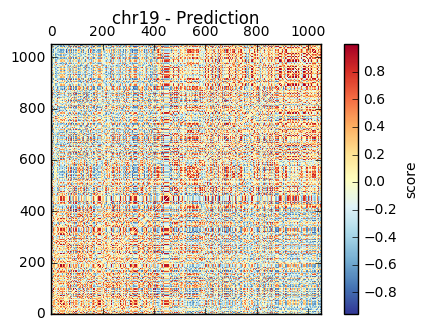

1.0
(1052, 1052)
Limit: 1.0


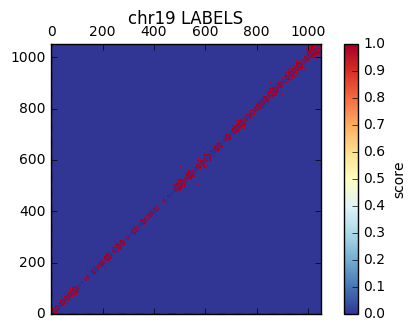

chr20
Balanced Accuracy: 55.01%	auROC: 0.595	 auPRC: 0.596
Recall at 5% | 10% | 25% FDR: 1.8% | 2.2% | 4.6%	Num Positives: 10062	 Num Negatives: 10062

chr20
0.999999997664
(619, 619)
Limit: 0.999999997664


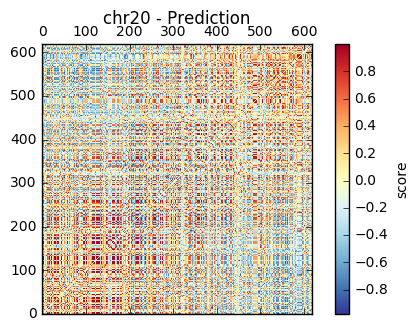

1.0
(619, 619)
Limit: 1.0


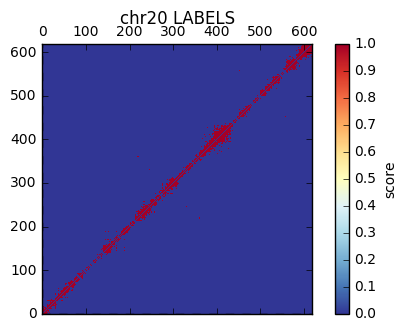

chr21
Balanced Accuracy: 55.83%	auROC: 0.589	 auPRC: 0.627
Recall at 5% | 10% | 25% FDR: 10.4% | 10.6% | 17.0%	Num Positives: 4080	 Num Negatives: 4080

chr21
0.999999997845
(280, 280)
Limit: 0.999999997845


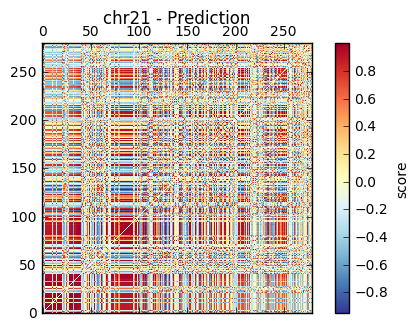

1.0
(280, 280)
Limit: 1.0


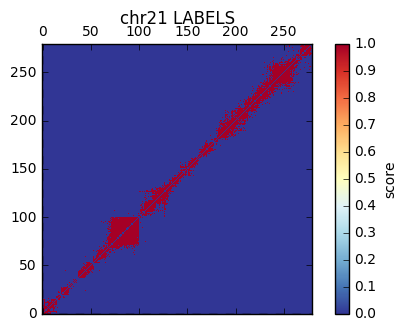

chr22
Balanced Accuracy: 51.13%	auROC: 0.521	 auPRC: 0.526
Recall at 5% | 10% | 25% FDR: 0.5% | 0.6% | 0.6%	Num Positives: 7140	 Num Negatives: 7140

chr22
0.999999475163
(431, 431)
Limit: 0.999999475163


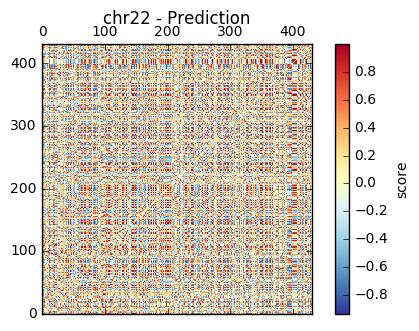

1.0
(431, 431)
Limit: 1.0


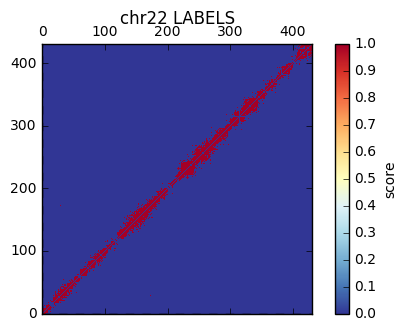

chrX
Balanced Accuracy: 65.47%	auROC: 0.740	 auPRC: 0.703
Recall at 5% | 10% | 25% FDR: 9.6% | 10.1% | 11.9%	Num Positives: 10302	 Num Negatives: 10302

chrX
0.999999999974
(861, 861)
Limit: 0.999999999974


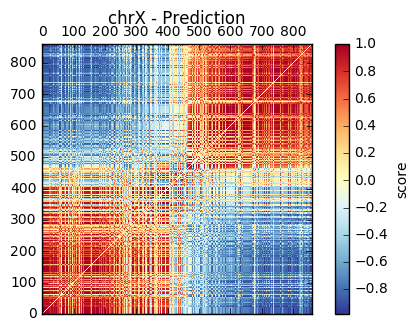

1.0
(861, 861)
Limit: 1.0


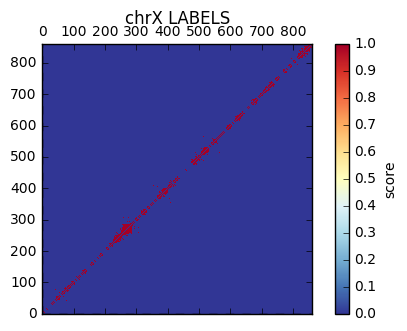

chr1 ROC= 0.763216311445 PRC= 0.719669931146
chr2 ROC= 0.776088948945 PRC= 0.729216323237
chr3 ROC= 0.757608084754 PRC= 0.713439129899
chr4 ROC= 0.729980507796 PRC= 0.713552948333
chr5 ROC= 0.733469665706 PRC= 0.698295296934
chr6 ROC= 0.754267733323 PRC= 0.712363293821
chr7 ROC= 0.7335403043 PRC= 0.703199355673
chr8 ROC= 0.731550337166 PRC= 0.697741934871
chr9 ROC= 0.744288379692 PRC= 0.703215750244
chr10 ROC= 0.691951086497 PRC= 0.676444626049
chr11 ROC= 0.714294564508 PRC= 0.733804987502
chr12 ROC= 0.687852731531 PRC= 0.676958213754
chr13 ROC= 0.689713564171 PRC= 0.663096624949
chr14 ROC= 0.67270025361 PRC= 0.673665337803
chr15 ROC= 0.635227130932 PRC= 0.654931471022
chr16 ROC= 0.656809793456 PRC= 0.630356461185
chr17 ROC= 0.622796581494 PRC= 0.625509930122
chr18 ROC= 0.62252678264 PRC= 0.618678660898
chr19 ROC= 0.601942925413 PRC= 0.606072569687
chr20 ROC= 0.595099648725 PRC= 0.596076125532
chr21 ROC= 0.588953287197 PRC= 0.626992055407
chr22 ROC= 0.520942612339 PRC= 0.525607540421
c

In [5]:
performance_on_pos_and_neg_subsmpl(0)

chr1
Balanced Accuracy: 64.97%	auROC: 0.743	 auPRC: 0.686
Recall at 5% | 10% | 25% FDR: 2.4% | 2.4% | 15.6%	Num Positives: 334	 Num Negatives: 334

chr1
0.99999999989
(2272, 2272)
Limit: 0.99999999989


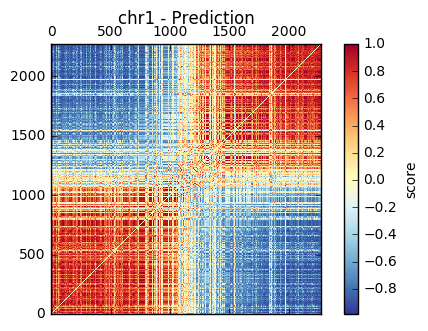

1.0
(2272, 2272)
Limit: 1.0


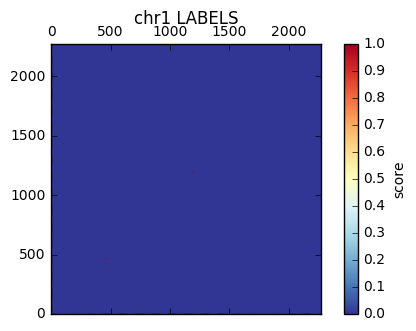

chr2
Balanced Accuracy: 59.69%	auROC: 0.695	 auPRC: 0.603
Recall at 5% | 10% | 25% FDR: 0.0% | 0.0% | 0.0%	Num Positives: 196	 Num Negatives: 196

chr2
0.999999999894
(1604, 1604)
Limit: 0.999999999894


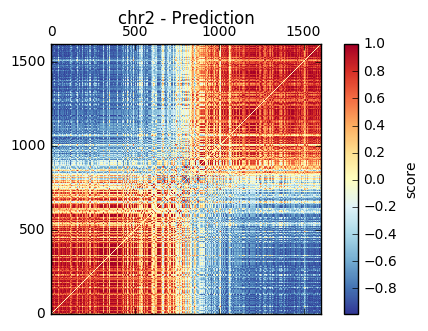

1.0
(1604, 1604)
Limit: 1.0


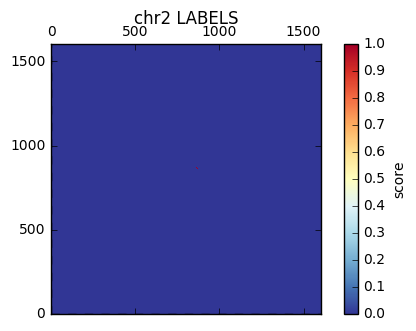

chr3
Balanced Accuracy: 72.02%	auROC: 0.789	 auPRC: 0.706
Recall at 5% | 10% | 25% FDR: 1.2% | 1.2% | 1.2%	Num Positives: 168	 Num Negatives: 168

chr3
0.999999999598
(1331, 1331)
Limit: 0.999999999598


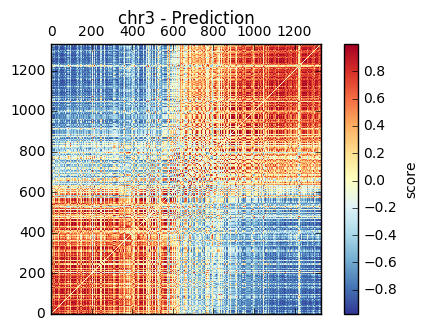

1.0
(1331, 1331)
Limit: 1.0


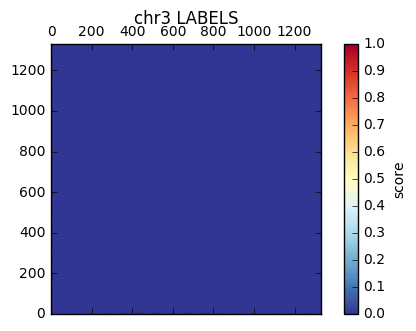

chr4
Balanced Accuracy: 64.29%	auROC: 0.728	 auPRC: 0.690
Recall at 5% | 10% | 25% FDR: 3.6% | 3.6% | 46.4%	Num Positives: 56	 Num Negatives: 56

chr4
0.999999999957
(947, 947)
Limit: 0.999999999957


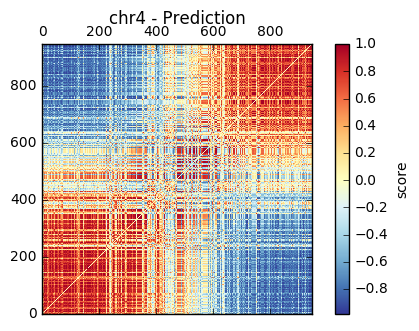

1.0
(947, 947)
Limit: 1.0


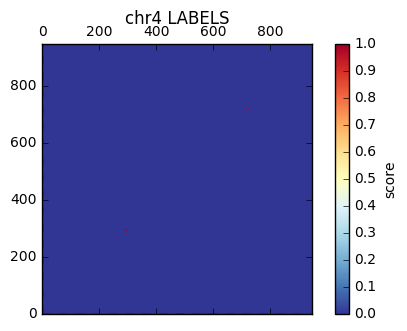

chr5
Balanced Accuracy: 76.61%	auROC: 0.872	 auPRC: 0.857
Recall at 5% | 10% | 25% FDR: 1.3% | 55.4% | 79.0%	Num Positives: 466	 Num Negatives: 466

chr5
0.999999999031
(1117, 1117)
Limit: 0.999999999031


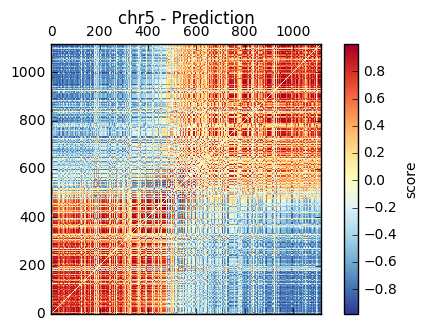

1.0
(1117, 1117)
Limit: 1.0


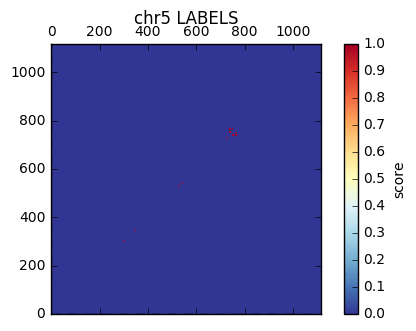

chr6
Balanced Accuracy: 74.24%	auROC: 0.838	 auPRC: 0.811
Recall at 5% | 10% | 25% FDR: 3.0% | 33.3% | 79.5%	Num Positives: 264	 Num Negatives: 264

chr6
0.999999999968
(1224, 1224)
Limit: 0.999999999968


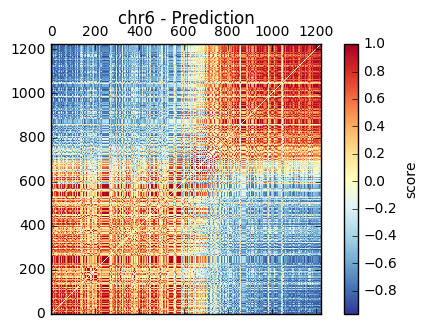

1.0
(1224, 1224)
Limit: 1.0


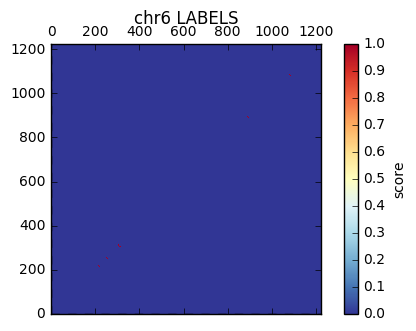

chr7
Balanced Accuracy: 63.37%	auROC: 0.709	 auPRC: 0.653
Recall at 5% | 10% | 25% FDR: 0.0% | 0.0% | 11.6%	Num Positives: 86	 Num Negatives: 86

chr7
0.99999999957
(1020, 1020)
Limit: 0.99999999957


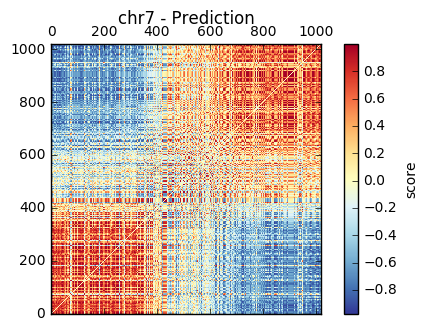

1.0
(1020, 1020)
Limit: 1.0


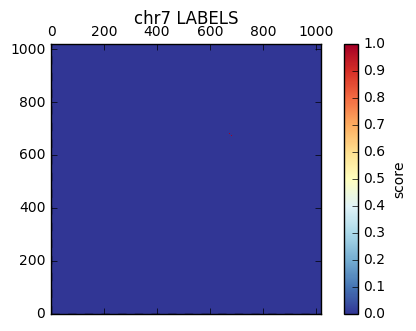

chr8
Balanced Accuracy: 54.35%	auROC: 0.648	 auPRC: 0.576
Recall at 5% | 10% | 25% FDR: 0.0% | 0.0% | 0.0%	Num Positives: 92	 Num Negatives: 92

chr8
0.999999999812
(897, 897)
Limit: 0.999999999812


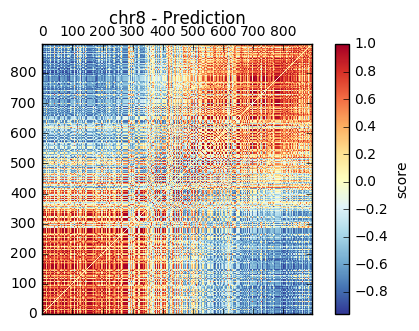

1.0
(897, 897)
Limit: 1.0


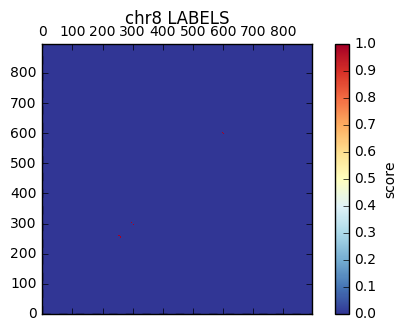

chr9
Balanced Accuracy: 65.52%	auROC: 0.749	 auPRC: 0.766
Recall at 5% | 10% | 25% FDR: 10.3% | 10.3% | 51.7%	Num Positives: 58	 Num Negatives: 58

chr9
0.999999997023
(859, 859)
Limit: 0.999999997023


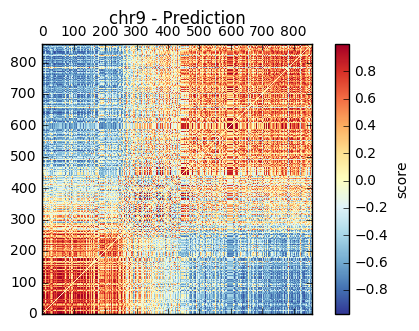

1.0
(859, 859)
Limit: 1.0


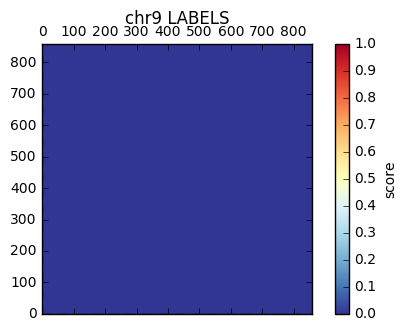

chr10
Balanced Accuracy: 60.19%	auROC: 0.702	 auPRC: 0.608
Recall at 5% | 10% | 25% FDR: 0.0% | 0.0% | 0.0%	Num Positives: 54	 Num Negatives: 54

chr10
0.999999999909
(943, 943)
Limit: 0.999999999909


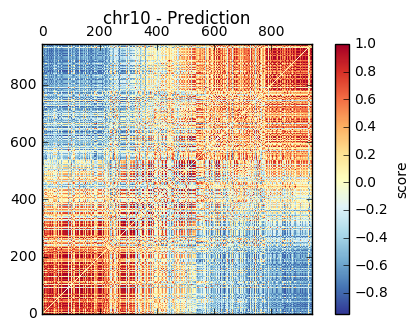

1.0
(943, 943)
Limit: 1.0


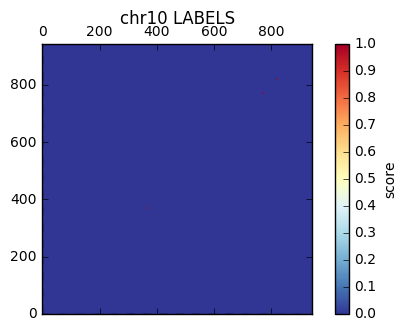

chr11
Balanced Accuracy: 58.97%	auROC: 0.656	 auPRC: 0.666
Recall at 5% | 10% | 25% FDR: 7.7% | 9.0% | 17.9%	Num Positives: 156	 Num Negatives: 156

chr11
0.999999999733
(1401, 1401)
Limit: 0.999999999733


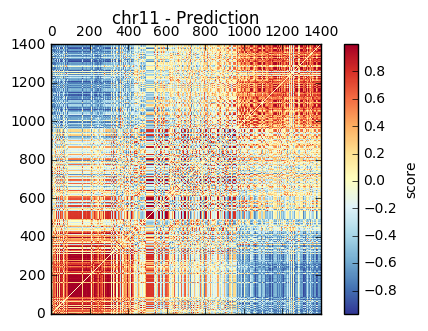

1.0
(1401, 1401)
Limit: 1.0


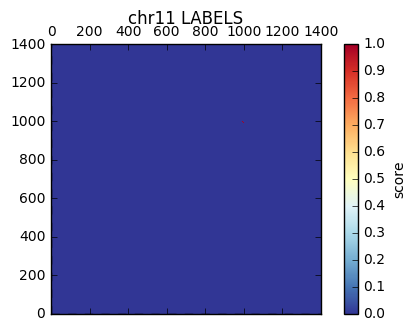

chr12
Balanced Accuracy: 59.80%	auROC: 0.692	 auPRC: 0.629
Recall at 5% | 10% | 25% FDR: 1.4% | 1.4% | 1.4%	Num Positives: 148	 Num Negatives: 148

chr12
0.999999999988
(1200, 1200)
Limit: 0.999999999988


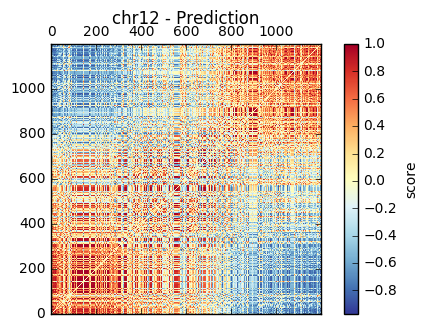

1.0
(1200, 1200)
Limit: 1.0


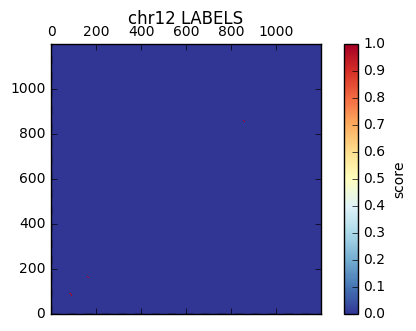

chr13
Balanced Accuracy: 45.83%	auROC: 0.590	 auPRC: 0.519
Recall at 5% | 10% | 25% FDR: 0.0% | 0.0% | 0.0%	Num Positives: 24	 Num Negatives: 24

chr13
0.999999975916
(452, 452)
Limit: 0.999999975916


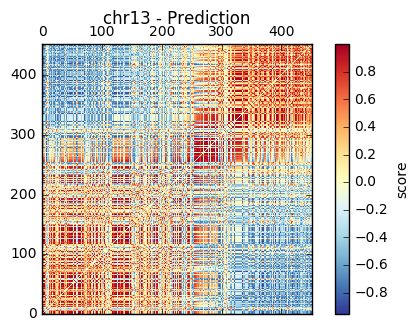

1.0
(452, 452)
Limit: 1.0


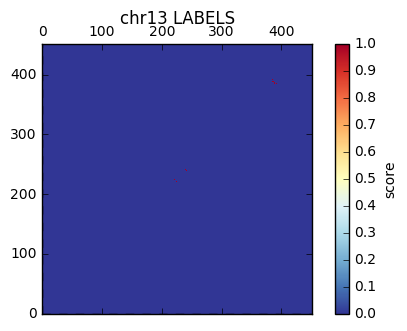

chr14
Balanced Accuracy: 56.86%	auROC: 0.644	 auPRC: 0.604
Recall at 5% | 10% | 25% FDR: 0.0% | 0.0% | 0.0%	Num Positives: 102	 Num Negatives: 102

chr14
0.999999999847
(779, 779)
Limit: 0.999999999847


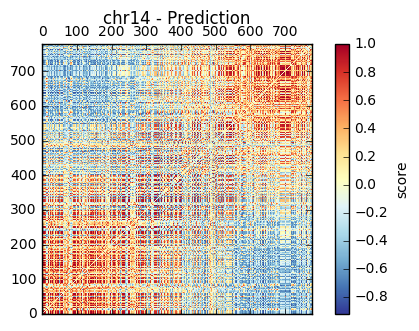

1.0
(779, 779)
Limit: 1.0


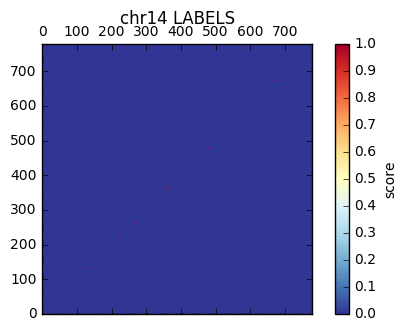

chr15
Balanced Accuracy: 55.68%	auROC: 0.668	 auPRC: 0.604
Recall at 5% | 10% | 25% FDR: 0.0% | 0.0% | 50.0%	Num Positives: 44	 Num Negatives: 44

chr15
0.999999998981
(629, 629)
Limit: 0.999999998981


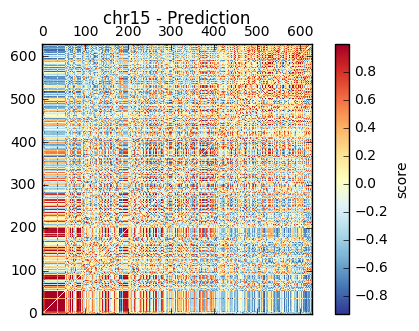

1.0
(629, 629)
Limit: 1.0


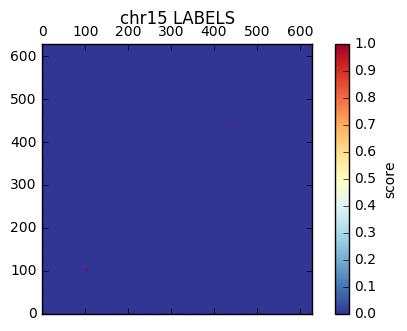

chr16
Balanced Accuracy: 53.05%	auROC: 0.562	 auPRC: 0.591
Recall at 5% | 10% | 25% FDR: 2.4% | 14.6% | 17.1%	Num Positives: 82	 Num Negatives: 82

chr16
0.999999996278
(726, 726)
Limit: 0.999999996278


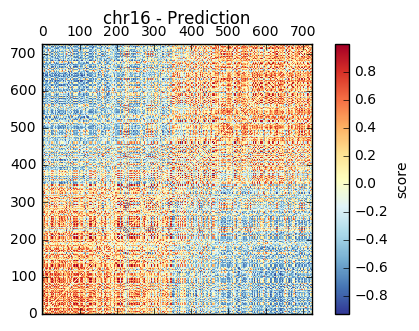

1.0
(726, 726)
Limit: 1.0


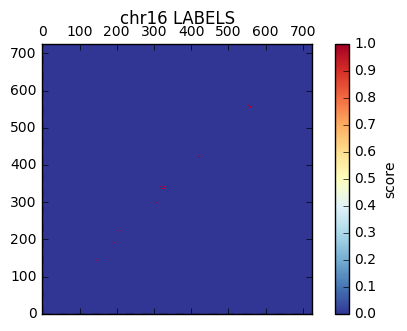

chr17
Balanced Accuracy: 55.17%	auROC: 0.583	 auPRC: 0.588
Recall at 5% | 10% | 25% FDR: 3.4% | 3.4% | 3.4%	Num Positives: 116	 Num Negatives: 116

chr17
0.999999991537
(1057, 1057)
Limit: 0.999999991537


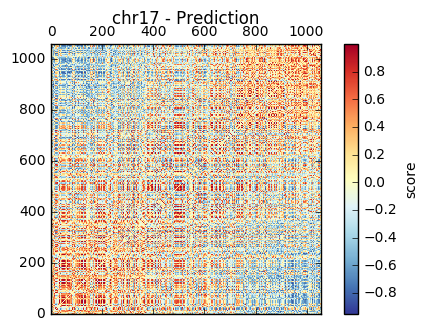

1.0
(1057, 1057)
Limit: 1.0


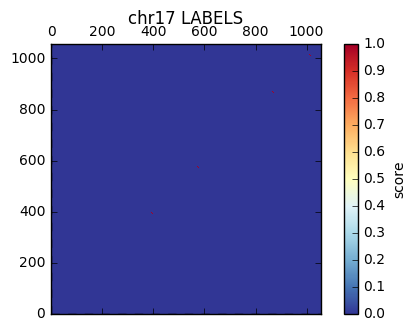

chr18
Balanced Accuracy: 60.00%	auROC: 0.535	 auPRC: 0.523
Recall at 5% | 10% | 25% FDR: 0.0% | 0.0% | 0.0%	Num Positives: 20	 Num Negatives: 20

chr18
0.999999979513
(352, 352)
Limit: 0.999999979513


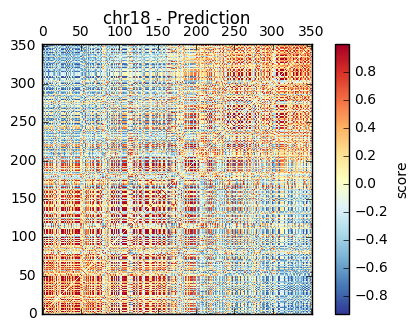

1.0
(352, 352)
Limit: 1.0


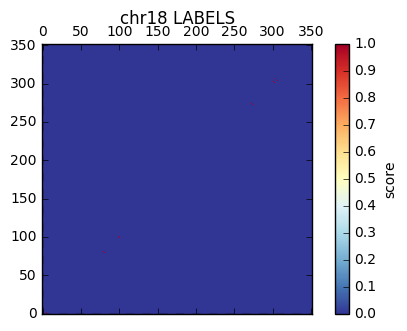

chr19
Balanced Accuracy: 57.29%	auROC: 0.592	 auPRC: 0.622
Recall at 5% | 10% | 25% FDR: 4.2% | 4.2% | 25.0%	Num Positives: 48	 Num Negatives: 48

chr19
0.999999981962
(1052, 1052)
Limit: 0.999999981962


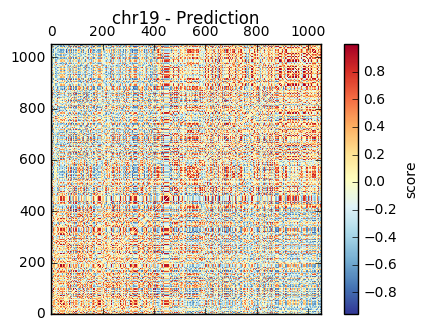

1.0
(1052, 1052)
Limit: 1.0


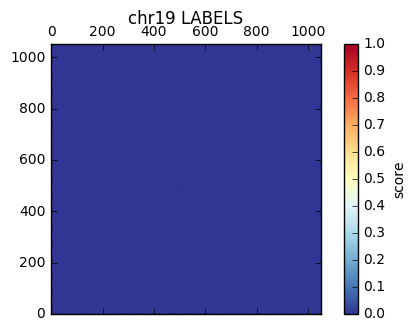

chr20
Balanced Accuracy: 58.82%	auROC: 0.638	 auPRC: 0.668
Recall at 5% | 10% | 25% FDR: 11.8% | 11.8% | 35.3%	Num Positives: 34	 Num Negatives: 34

chr20
0.999999997664
(619, 619)
Limit: 0.999999997664


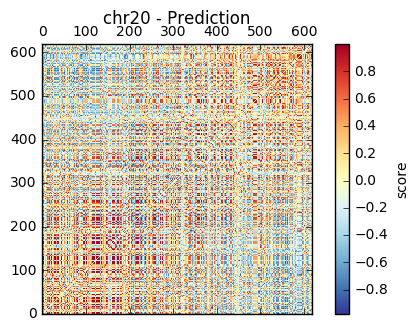

1.0
(619, 619)
Limit: 1.0


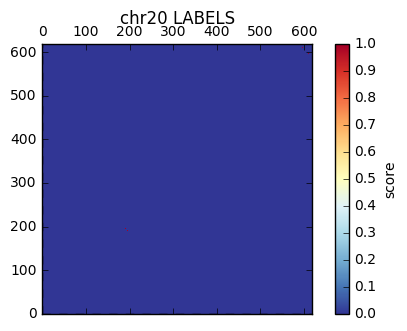

chr21
Balanced Accuracy: 39.29%	auROC: 0.347	 auPRC: 0.389
Recall at 5% | 10% | 25% FDR: 0.0% | 0.0% | 0.0%	Num Positives: 14	 Num Negatives: 14

chr21
0.999999997845
(280, 280)
Limit: 0.999999997845


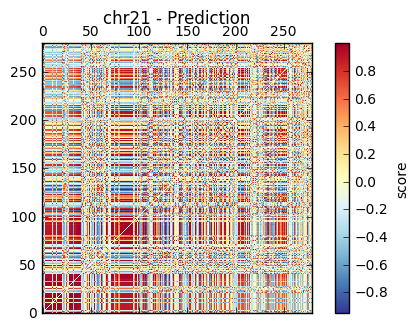

1.0
(280, 280)
Limit: 1.0


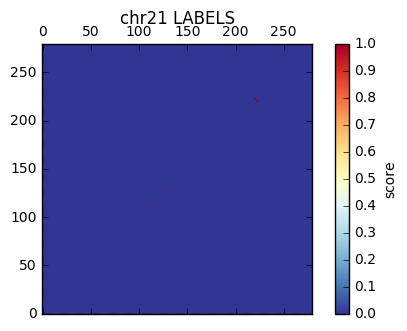

chr22
Balanced Accuracy: 57.69%	auROC: 0.737	 auPRC: 0.752
Recall at 5% | 10% | 25% FDR: 15.4% | 15.4% | 61.5%	Num Positives: 26	 Num Negatives: 26

chr22
0.999999475163
(431, 431)
Limit: 0.999999475163


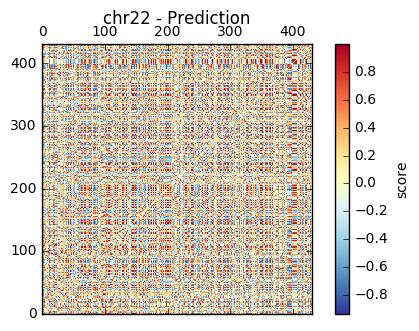

1.0
(431, 431)
Limit: 1.0


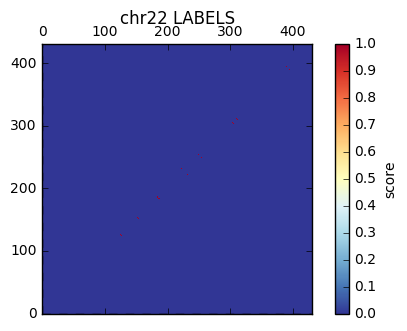

chrX
Balanced Accuracy: 63.46%	auROC: 0.725	 auPRC: 0.608
Recall at 5% | 10% | 25% FDR: 0.0% | 0.0% | 0.0%	Num Positives: 26	 Num Negatives: 26

chrX
0.999999999974
(861, 861)
Limit: 0.999999999974


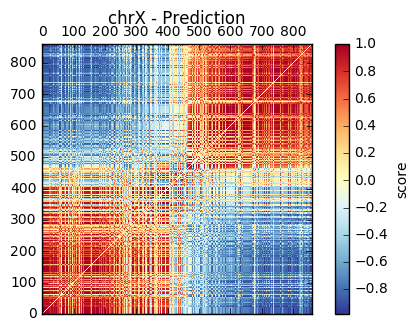

1.0
(861, 861)
Limit: 1.0


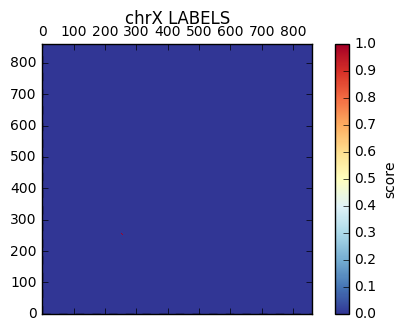

chr1 ROC= 0.74271218043 PRC= 0.686450603387
chr2 ROC= 0.695022907122 PRC= 0.602999472768
chr3 ROC= 0.788761337868 PRC= 0.70620219042
chr4 ROC= 0.727678571429 PRC= 0.68978370209
chr5 ROC= 0.87184328317 PRC= 0.856741881212
chr6 ROC= 0.838211662075 PRC= 0.810615408938
chr7 ROC= 0.708761492699 PRC= 0.653435398369
chr8 ROC= 0.647920604915 PRC= 0.575541027468
chr9 ROC= 0.749108204518 PRC= 0.766349557016
chr10 ROC= 0.701646090535 PRC= 0.608458962793
chr11 ROC= 0.656393819855 PRC= 0.666122585327
chr12 ROC= 0.692019722425 PRC= 0.628835864356
chr13 ROC= 0.590277777778 PRC= 0.519016428653
chr14 ROC= 0.643790849673 PRC= 0.603558297054
chr15 ROC= 0.668388429752 PRC= 0.604145557051
chr16 ROC= 0.562165377751 PRC= 0.590649854441
chr17 ROC= 0.583234244946 PRC= 0.588178523345
chr18 ROC= 0.535 PRC= 0.523099524707
chr19 ROC= 0.592013888889 PRC= 0.622359954416
chr20 ROC= 0.638408304498 PRC= 0.66816229373
chr21 ROC= 0.34693877551 PRC= 0.388808250573
chr22 ROC= 0.736686390533 PRC= 0.752458386282
chrX ROC= 0.

In [21]:
performance_on_pos_and_neg_subsmpl(10)

### Evaluation on pos + distance-matched negatives [10kb, 2Mb]

## thres=0

In [28]:
all_chrs = ['chr'+str(i+1) for i in range(22)]+['chrX']
ROC=[]
PRC=[]
for chr in all_chrs:
    y=np.load(DATADIR_dist_matched_labels_CaptureC+'labels_dist_matched_CaptureC_'+chr+'_thres0.npy')
    y_pred=np.load(DATADIR_dist_matched_preds_CaptureC+'preds_dist_matched_CaptureC_'+chr+'_thres0.npy')
    ROC.append(roc_auc_score(y, y_pred))
    precision, recall = precision_recall_curve(y, y_pred)[:2]
    PRC.append(auc(recall, precision))
    print(ClassificationResult(y, y_pred))
    
for i in enumerate(all_chrs):     
    print i[1], "ROC=", ROC[i[0]], "PRC=", PRC[i[0]]
print "Average across all chrs: ROC=", sum(ROC)/len(ROC), " PRC=", sum(PRC)/len(PRC)

Balanced Accuracy: 47.98%	auROC: 0.487	 auPRC: 0.504
Recall at 5% | 10% | 25% FDR: 0.0% | 0.0% | 0.0%	Num Positives: 14938	 Num Negatives: 14938

Balanced Accuracy: 46.43%	auROC: 0.448	 auPRC: 0.476
Recall at 5% | 10% | 25% FDR: 0.1% | 0.1% | 0.1%	Num Positives: 7330	 Num Negatives: 7330

Balanced Accuracy: 47.30%	auROC: 0.475	 auPRC: 0.505
Recall at 5% | 10% | 25% FDR: 0.0% | 0.0% | 0.0%	Num Positives: 6078	 Num Negatives: 6078

Balanced Accuracy: 43.88%	auROC: 0.437	 auPRC: 0.468
Recall at 5% | 10% | 25% FDR: 0.0% | 0.0% | 0.0%	Num Positives: 3594	 Num Negatives: 3594

Balanced Accuracy: 50.71%	auROC: 0.495	 auPRC: 0.501
Recall at 5% | 10% | 25% FDR: 0.2% | 0.3% | 0.5%	Num Positives: 5756	 Num Negatives: 5756

Balanced Accuracy: 52.24%	auROC: 0.528	 auPRC: 0.537
Recall at 5% | 10% | 25% FDR: 0.0% | 0.0% | 0.0%	Num Positives: 8258	 Num Negatives: 8258

Balanced Accuracy: 48.90%	auROC: 0.503	 auPRC: 0.524
Recall at 5% | 10% | 25% FDR: 0.2% | 0.2% | 1.1%	Num Positives: 4674	 Num Negativ

## Thres=10

In [27]:
all_chrs = ['chr'+str(i+1) for i in range(22)]+['chrX']
ROC=[]
PRC=[]
for chr in all_chrs:
    y=np.load(DATADIR_dist_matched_labels_CaptureC+'labels_dist_matched_CaptureC_'+chr+'_thres10.npy')
    y_pred=np.load(DATADIR_dist_matched_preds_CaptureC+'preds_dist_matched_CaptureC_'+chr+'_thres10.npy')
    ROC.append(roc_auc_score(y, y_pred))
    precision, recall = precision_recall_curve(y, y_pred)[:2]
    PRC.append(auc(recall, precision))
    print(ClassificationResult(y, y_pred))
    
for i in enumerate(all_chrs):     
    print i[1], "ROC=", ROC[i[0]], "PRC=", PRC[i[0]]
print "Average across all chrs: ROC=", sum(ROC)/len(ROC), " PRC=", sum(PRC)/len(PRC)

Balanced Accuracy: 39.66%	auROC: 0.369	 auPRC: 0.430
Recall at 5% | 10% | 25% FDR: 0.6% | 0.6% | 0.6%	Num Positives: 324	 Num Negatives: 324

Balanced Accuracy: 37.82%	auROC: 0.303	 auPRC: 0.374
Recall at 5% | 10% | 25% FDR: 0.0% | 0.0% | 0.0%	Num Positives: 156	 Num Negatives: 156

Balanced Accuracy: 55.19%	auROC: 0.536	 auPRC: 0.499
Recall at 5% | 10% | 25% FDR: 0.0% | 0.0% | 0.0%	Num Positives: 154	 Num Negatives: 154

Balanced Accuracy: 32.58%	auROC: 0.333	 auPRC: 0.427
Recall at 5% | 10% | 25% FDR: 0.0% | 0.0% | 6.1%	Num Positives: 66	 Num Negatives: 66

Balanced Accuracy: 58.55%	auROC: 0.669	 auPRC: 0.635
Recall at 5% | 10% | 25% FDR: 0.0% | 0.0% | 36.8%	Num Positives: 468	 Num Negatives: 468

Balanced Accuracy: 54.26%	auROC: 0.564	 auPRC: 0.578
Recall at 5% | 10% | 25% FDR: 0.0% | 0.0% | 0.0%	Num Positives: 258	 Num Negatives: 258

Balanced Accuracy: 30.68%	auROC: 0.257	 auPRC: 0.368
Recall at 5% | 10% | 25% FDR: 0.0% | 0.0% | 0.0%	Num Positives: 88	 Num Negatives: 88

Balanced 